# Notebook for analysing all VR trials of one experimental group; 2-object forest

## For anaysis of *HC conditioning experiments*

## Assumes use of FlyOver version 9.7 or higher (closed-loop optogenetic stimulation possible)
## Data from multiple trials and flies is pooled and collected in a single data frame, which is then used for data visualisation and statistics.

In [1]:
__author__ = 'Hannah Haberkern, hjmhaberkern@gmail.com'

import numpy as np
import pandas as pd 
    
from os import mkdir, walk, getcwd
from os.path import sep, exists
from sys import path, exit
from glob import glob

import matplotlib.pyplot as plt
import matplotlib.colors as colors
from matplotlib import gridspec
import seaborn as sns

from Tkinter import Tk
from tkFileDialog import askdirectory, askopenfilename

# Set path to analysis code directory
codeDir = sep.join(getcwd().split(sep)[:-2])
path.insert(1, codeDir)

from flyVR.flyVRoptogenetics.flyVRoptogenetics_oneTrialBasicAnalysis import singleTwoObjVROptogenTrialAnalysis

from plottingUtilities.basicPlotting import makeNestedPlotDirectory, myAxisTheme,_myAccentList
from plottingUtilities.objectInteractionPlots import plotWalkingVelocityDistr
from plottingUtilities.plotsWithDataframe import oneDimResidencyWithVar_2LM_df

from trajectoryAnalysis.trajectoryDerivedParams import relationToObject
from trajectoryAnalysis.circularStatsOnTrajectories import circmeanvec

from plottingUtilities.objectPreferencePlots import countvisits, diffCorrPlot, prettyBoxPlot, simpleBoxPlot


# Choose files to analyse ..............................................................................................

baseDir = '/Volumes/jayaramanlab/Hannah/Projects/FlyVR/1_Experiments/twoObjOpto'

root = Tk()
# prevents root window from appearing
root.withdraw()
# choose experiment folder
dataDir = askdirectory(initialdir=baseDir,
                       title='Select experiment directory (containing directories for multiple flies)') + sep
root.update()
root.destroy()
expDirs = sorted(walk(dataDir).next()[1])

analysisDir = sep.join(dataDir.split(sep)[:-2]) + sep + 'analysis' + sep

try:
    expDirs.remove('virtualWorld')
except:
    print('You selected an invalid data directory.\n' +
          'Expected folder structure of the selected path is some/path/to/experimentName/flyGender/rawData/')
    exit(1)

print('\n Analysing the following folders:\n')
print(expDirs)

rerunbasicanalysis = raw_input('Would you like to (re-)run the basic analysis on each file \n'
                               'instead of loading previously saved data? (y, n)\n')


 Analysing the following folders:

['m01', 'm02', 'm03', 'm04', 'm05', 'm06', 'm07', 'm08', 'm09', 'm10', 'm11', 'm12', 'm13', 'm14', 'm15', 'm16', 'm17', 'm18', 'm19', 'm20', 'm21', 'm22', 'm23', 'm24', 'm25']
Would you like to (re-)run the basic analysis on each file 
instead of loading previously saved data? (y, n)
n


In [83]:
expDirs=expDirs[:]
print(expDirs)

('m01', 'm04', 'm07', 'm08', 'm11', 'm13', 'm17', 'm19', 'm21', 'm25')


In [82]:
# Uncomment, if you want to select a specific subset of flies (e.g. good learners..)
from operator import itemgetter
my_indices = [0, 3, 6, 7, 10, 12, 16, 18, 20, 24] #[0,2,4,6,7,8,9,10,11,12]
expDirs = itemgetter(*my_indices)(expDirs)

selectionTag = '_top10'  # chose small string, to specify dataset (e.g. top5 flies)

In [84]:
%matplotlib inline 

### Compose mutli-fly data into dataframe

In [85]:
# generate fly color map
numFlies = len(expDirs)
cNorm  = colors.Normalize(vmin=0, vmax=numFlies)

mycmap = colors.LinearSegmentedColormap.from_list('myAccent',_myAccentList, N=256, gamma=1.0)
flyCMap = plt.cm.ScalarMappable(norm=cNorm,cmap=mycmap)

In [86]:
expDir = dataDir + expDirs[0] + sep
FODataFiles = [filepath.split(sep)[-1] for filepath in glob(expDir + '*.txt')]

In [87]:
keylist = ['headingAngle','rotVelo','time','transVelo',
           'xPos','xPosInMiniarena','yPos','yPosInMiniarena','rEvents']

keylistLong = ['flyID','trial','trialtype','reinforcement','starvation','moving'] + keylist
FOAllFlies_df = pd.DataFrame(data=np.zeros((0,len(keylistLong))), columns=keylistLong)

nTrialsPr = 0
nTrialsTr = 0
nTrialsPo = 0
 
vTransTH = 2 #mm/s

# Go through directories of experiments with different flies ...............................................
for currExpDir in expDirs:

    expDir = dataDir + currExpDir + sep
    print('\n Analysing the following folder:\n')
    print(expDir)

    FODataFiles = [filepath.split(sep)[-1] for filepath in glob(expDir + '*.txt')]
    FODataFiles = sorted(FODataFiles)

    print('\n Analysing the following log files:\n')
    print(FODataFiles)

    # Run single trial analysis on each file in folder .....................................................
    for fileToAnalyse in FODataFiles:
        
        flyID = fileToAnalyse.split('_')[8]
        genotype = fileToAnalyse.split('_')[6]
        starvation = fileToAnalyse.split('_')[5]
        trial = FODataFiles.index(fileToAnalyse) + 1
        
        if rerunbasicanalysis == 'y':
            returnVal = singleTwoObjVROptogenTrialAnalysis(expDir + fileToAnalyse)
            print('Ran analysis, now loading saved *.npy file.')
            FODatLoad = np.load(expDir + fileToAnalyse[:-3] + 'npy')[()]
        else:
            print('Loading saved *.npy file.')
            FODatLoad = np.load(expDir + fileToAnalyse[:-3] + 'npy')[()]

        # Split into visible object trials and invisible object trials
        if 'train' in fileToAnalyse:
            trialtype = 'train'
            rZones = 'on'
            nTrialsTr += 1
        elif 'pre' in fileToAnalyse:
            trialtype = 'pre'
            rZones = 'off'
            nTrialsPr += 1
        else:
            trialtype = 'post'
            rZones = 'off'
            nTrialsPo += 1
        
        vTrans = np.copy(FODatLoad['transVelo'])
        moving = vTrans >= vTransTH

        FODatLoad_df = pd.DataFrame.from_dict(FODatLoad,orient='columns')
        FODatLoad_df.insert(0, 'flyID', flyID)
        FODatLoad_df.insert(1, 'trial', trial)
        FODatLoad_df.insert(2, 'trialtype', trialtype)
        FODatLoad_df.insert(3, 'reinforcement', rZones)
        FODatLoad_df.insert(4, 'starvation', int(starvation[:-1]))
        FODatLoad_df.insert(5, 'moving', moving)
        
        FOAllFlies_df = FOAllFlies_df.append(FODatLoad_df)
        
        # TODO: Add selection criteria, e.g. to only include trials from flies that were 
        # walking >40% of time and did not have a strong turn bias.
        


 Analysing the following folder:

/Volumes/jayaramanlab/Hannah/Projects/FlyVR/1_Experiments/twoObjOpto/HC_x_10xChrimsonR/baseline10/controlConeCyli/male/rawData/m01/

 Analysing the following log files:

['twoObjectForestControl_1cm4cmCone_08cm3cmCyli_6cmGrid_6-7d_9h_10xChrR-HC-Ret_10bl_m01_post_out_170202203959.txt', 'twoObjectForestControl_1cm4cmCone_08cm3cmCyli_6cmGrid_6-7d_9h_10xChrR-HC-Ret_10bl_m01_pre_out_170202194613.txt', 'twoObjectForestControl_1cm4cmCone_08cm3cmCyli_6cmGrid_6-7d_9h_10xChrR-HC-Ret_10bl_m01_train_out_170202201815.txt']
Loading saved *.npy file.
Loading saved *.npy file.
Loading saved *.npy file.

 Analysing the following folder:

/Volumes/jayaramanlab/Hannah/Projects/FlyVR/1_Experiments/twoObjOpto/HC_x_10xChrimsonR/baseline10/controlConeCyli/male/rawData/m04/

 Analysing the following log files:

['twoObjectForestControl_1cm4cmCone_08cm3cmCyli_6cmGrid_8-9d_7h_10xChrR-HC-Ret_10bl_m04_post_out_170206183837.txt', 'twoObjectForestControl_1cm4cmCone_08cm3cmCyli_6cm

In [88]:
FOAllFlies_df = FOAllFlies_df[keylistLong]

FOAllFlies_df['flyID'] = FOAllFlies_df['flyID'].astype('category')
FOAllFlies_df['trial'] = FOAllFlies_df['trial'].astype('category')
FOAllFlies_df['trialtype'] = FOAllFlies_df['trialtype'].astype('category')
FOAllFlies_df['reinforcement'] = FOAllFlies_df['reinforcement'].astype('category')

FOAllFlies_df 

,flyID,trial,trialtype,reinforcement,starvation,moving,headingAngle,rotVelo,time,transVelo,xPos,xPosInMiniarena,yPos,yPosInMiniarena,rEvents
0,m01,1.0,post,off,9.0,1.0,-0.000004,0.314213,0.000000,2.458721,60.622000,60.622000,35.000000,35.000000,10.0
1,m01,1.0,post,off,9.0,0.0,0.015708,1.806289,0.050004,1.931961,60.499089,60.499089,34.997107,34.997107,10.0
2,m01,1.0,post,off,9.0,1.0,0.106029,2.827235,0.100007,5.466498,60.404100,60.404100,35.014700,35.014700,10.0
3,m01,1.0,post,off,9.0,1.0,0.247400,3.691112,0.150011,7.088550,60.506221,60.506221,35.268251,35.268251,10.0
4,m01,1.0,post,off,9.0,1.0,0.431969,4.319386,0.200014,7.702125,60.650817,60.650817,35.591869,35.591869,10.0
5,m01,1.0,post,off,9.0,1.0,0.647953,5.104729,0.250018,8.747077,60.685981,60.685981,35.975394,35.975394,10.0
6,m01,1.0,post,off,9.0,1.0,0.903208,5.497401,0.300021,7.651728,60.538600,60.538600,36.387200,36.387200,10.0
7,m01,1.0,post,off,9.0,1.0,1.178097,5.811538,0.350025,4.690183,60.347872,60.347872,36.718886,36.718886,10.0
8,m01,1.0,post,off,9.0,1.0,1.468695,5.733003,0.400028,7.497454,60.170028,60.170028,36.871771,36.871771,10.0
9,m01,1.0,post,off,9.0,1.0,1.755365,6.204209,0.450032,11.192403,59.795337,59.795337,36.859286,36.859286,10.0


In [89]:
keyind_xPos = keylistLong.index('xPosInMiniarena')
keyind_yPos = keylistLong.index('yPosInMiniarena')
keyind_mov = keylistLong.index('moving')
keyind_fly = keylistLong.index('flyID')
keyind_vT = keylistLong.index('transVelo')
keyind_ang = keylistLong.index('headingAngle')
keyind_t = keylistLong.index('time')
keyind_vR = keylistLong.index('rotVelo')
keyind_EV = keylistLong.index('rEvents')

flyIDallarray = np.asarray(FOAllFlies_df.iloc[:,keyind_fly:keyind_fly+1]).squeeze()
flyIDs = sorted(list(set(flyIDallarray.tolist())))

### Define structure of trials in terms of closed-loop optogenetic stimulation and presence of landmark cues

In [90]:
# Two object reinforcement test
rZoneState = ['off','on','off']
visibilityState = ['visible','visible','visible']
groundPlane = ['texture','texture','texture']
trialName = ['pre','train','post']
gridSize = 60.0

fps = 20

coneColor = 'mediumseagreen'
cyliColor = 'mediumorchid'

In [91]:
visitRad = 15

coneCoords = [[gridSize/2, gridSize/2],
              [3*gridSize/2, -gridSize/2]]
cyliCoords = [[gridSize/2, -gridSize/2],
              [3*gridSize/2, gridSize/2]]

### 2D (cartesian) residency

Plot directory already exists


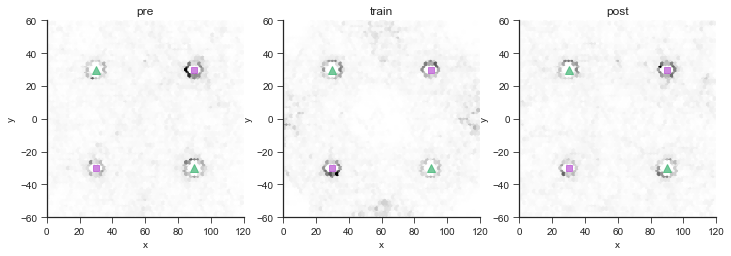

In [95]:
# plot parameter
numBins = 60

hexplotfig = plt.figure(figsize=(12,4))
for trial, condition in enumerate(trialName):
    querystring = '(trialtype == "' + condition + '") & (moving > 0)'
    xPosMA = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_xPos:keyind_xPos+1]).squeeze()
    yPosMA = np.asarray(FOAllFlies_df.query(querystring).iloc[:,keyind_yPos:keyind_yPos+1]).squeeze()
    ax = hexplotfig.add_subplot(1,len(trialName),trial+1)
    ax.hexbin(xPosMA, yPosMA, gridsize=numBins, cmap='Greys')
    plt.xlabel('x'); plt.ylabel('y')
    
    ax.plot(gridSize/2, -gridSize/2, marker='s', markersize=6, alpha=0.7, color=cyliColor)
    ax.plot(gridSize/2, gridSize/2, marker='^', markersize=8, alpha=0.7, color=coneColor)
    ax.plot(3*gridSize/2, -gridSize/2, marker='^', markersize=8, alpha=0.7, color=coneColor)
    ax.plot(3*gridSize/2, gridSize/2, marker='s', markersize=6, alpha=0.7, color=cyliColor)
            
    ax.set_title(trialName[trial])
    ax.set_xlim(0,120)
    ax.set_ylim(-60,60)
    ax.set_aspect('equal')
    myAxisTheme(ax)
try:
    mkdir(analysisDir + 'residencyPlots/')
except:
    print('Plot directory already exists')
hexplotfig.savefig(analysisDir + 'residencyPlots/'+ genotype +'_'+flyIDs[0][0]
                   +'_residencyMA_n'+ str(len(flyIDs))+selectionTag+'.pdf', format='pdf')

### Shared settings for plots

In [102]:
# Settings for boxplots of all three trials:

objtypeNames = ['Cone','Cylinder']

objBoxColors = [['lightgreen','seagreen','mediumseagreen'],
                ['palevioletred','darkmagenta','mediumorchid']] #for spec. objects
# [['tomato','red','tomato'],['steelblue','blue','steelblue']]
BoxColors = ['grey','slateblue','royalblue'] # for ratio between objects
# ['grey','darkred','grey']

trialColors = ['darkseagreen', 'darkviolet','teal']
trialMarkers = ['d','*','o']

offsets = [1.3, 1.3, 1.3]

boxalpha = 0.5
linealpha=0.5

allTrialFigSize = (12,4)
twoTrialFigSize = (16,4)

## Spatial analysis of relative heading angle distributions

### Bin data according to distance and angular position rel. to one landmark type (e.g. cylinder)

In [93]:
coneCoords = [[-gridSize/2, 3*gridSize/2],
              [-gridSize/2, -gridSize/2],
              [gridSize/2, gridSize/2],
              [gridSize/2, -3*gridSize/2],
              [3*gridSize/2, 3*gridSize/2],
              [3*gridSize/2, -gridSize/2],
              [5*gridSize/2, gridSize/2],
              [5*gridSize/2, -3*gridSize/2]]

cyliCoords = [[-gridSize/2, gridSize/2],
              [-gridSize/2, -3*gridSize/2],
              [gridSize/2, 3*gridSize/2],
              [gridSize/2, -gridSize/2],
              [3*gridSize/2, gridSize/2],
              [3*gridSize/2, -3*gridSize/2],
              [5*gridSize/2, 3*gridSize/2],
              [5*gridSize/2, -gridSize/2]]

In [39]:
def computeLMcentricPosition(refCoords, flyName):
    refCoords = np.asarray(refCoords)
    
    dist2LMTrials = []
    xLMTrials = []
    yLMTrials = []
    angleLMTrials = []
    gammaTrials = []
    gammaFullTrials = []

    for trial in range(len(trialName)):
        trialtype =trialName[trial]
        
        if (flyName == 'all'):
            querystring = '(trialtype=="' + trialtype + '") & (moving>0) '#& (flyID == "'+flyIDs[fly]+'")'
        else:
            querystring = '(trialtype=="' + trialtype + '") & (moving>0) & (flyID == "'+flyName+'")'
                
        xPosTrial = FOAllFlies_df.query(querystring).iloc[:, keyind_xPos:keyind_xPos+1].values.squeeze()
        yPosTrial = FOAllFlies_df.query(querystring).iloc[:, keyind_yPos:keyind_yPos+1].values.squeeze()
        headTrial = FOAllFlies_df.query(querystring).iloc[:, keyind_ang:keyind_ang+1].values.squeeze()
        timeTrial = FOAllFlies_df.query(querystring).iloc[:, keyind_t:keyind_t+1].values.squeeze()

        # compute distance to reference landmark
        xpos = np.tile(xPosTrial,len(coneCoords)).reshape(len(coneCoords),len(xPosTrial)).T
        ypos = np.tile(yPosTrial,len(coneCoords)).reshape(len(coneCoords),len(yPosTrial)).T
        refcoordx = np.tile(refCoords[:,0],len(xpos)).reshape(len(xpos),len(refCoords))
        refcoordy = np.tile(refCoords[:,1],len(xpos)).reshape(len(xpos),len(refCoords))
        dist2LMAll = np.hypot((xpos-refcoordx),(ypos-refcoordy))

        # compute distance to closest of the two reference landmarks
        dist2LM = np.min(dist2LMAll,axis=1)
        minInd = np.argmin(dist2LMAll,axis=1)

        # select corresponding x and y positions
        xLM = np.nan*np.ones(len(xPosTrial))
        yLM = np.nan*np.ones(len(xPosTrial))
        for pt in range(len(xPosTrial)):
            xLM[pt] = xPosTrial[pt]-refCoords[minInd[pt]][0]
            yLM[pt] = yPosTrial[pt]-refCoords[minInd[pt]][1]

        # compute angular position (not heading!) relative to reference landmark  
        angleLM = np.arccos(xLM/dist2LM)
        angleLM[yLM<0] = -1*angleLM[yLM<0]

        # compute relative heading angle
        LMdir, LMdist, gammaFull, gamma, _ = relationToObject(timeTrial, xLM, yLM, headTrial, [0,0])

        # compute change in landmark distance
        dLMdist = np.hstack((0,np.diff(dist2LM)))

        dist2LMTrials.append(dist2LM)
        xLMTrials.append(xLM)
        yLMTrials.append(yLM)
        angleLMTrials.append(angleLM)
        gammaTrials.append(gamma)
        gammaFullTrials.append(gammaFull)
        
    return dist2LMTrials, xLMTrials, yLMTrials, angleLMTrials, gammaTrials, gammaFullTrials

Plot directory already exists


/Users/haberkernh/anaconda/envs/py2.7/lib/python2.7/site-packages/ipykernel_launcher.py:32: RuntimeWarning: invalid value encountered in greater
/Users/haberkernh/anaconda/envs/py2.7/lib/python2.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in greater
/Users/haberkernh/anaconda/envs/py2.7/lib/python2.7/site-packages/ipykernel_launcher.py:38: RuntimeWarning: invalid value encountered in greater
/Users/haberkernh/anaconda/envs/py2.7/lib/python2.7/site-packages/ipykernel_launcher.py:49: RuntimeWarning: invalid value encountered in greater
/Users/haberkernh/anaconda/envs/py2.7/lib/python2.7/site-packages/ipykernel_launcher.py:60: RuntimeWarning: invalid value encountered in greater


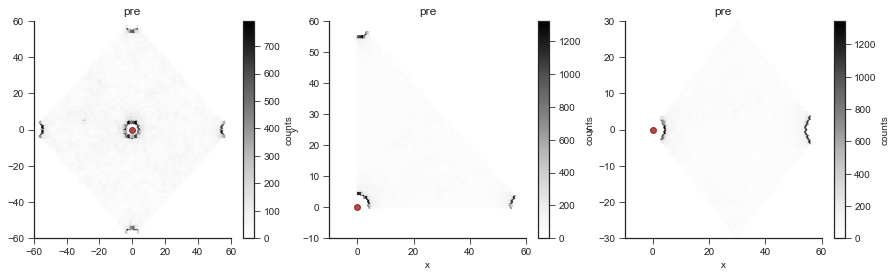

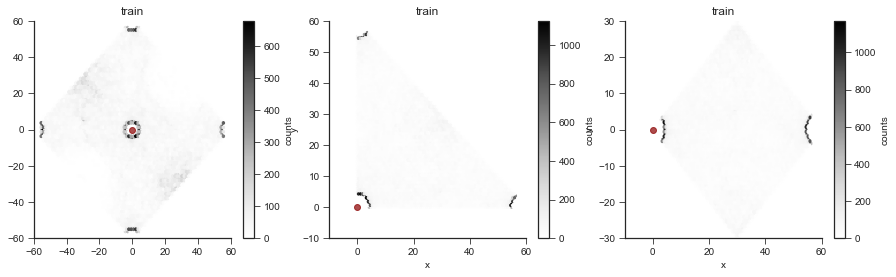

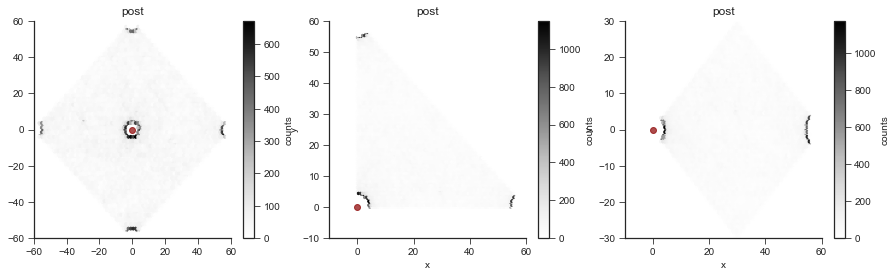

In [41]:
# Visualisae residency
try:
    mkdir(analysisDir + 'LMcentricAnalysis/')
except:
    print('Plot directory already exists')


for trial in range(len(trialName)):
    trialtype =trialName[trial]

    LMview = plt.figure(figsize=(13,4))
    LMviewhist = plt.figure(figsize=(15,4))

    dist2LM = dist2LMTrials[trial]
    angleLM = angleLMTrials[trial]
    xLM = xLMTrials[trial]
    yLM = yLMTrials[trial]
    gamma = gammaTrials[trial]

    dLMdist = np.hstack((0,np.diff(dist2LM)))
    
    minDist = 0
    minRes = 0

    # use symmetry along x and y axis -> collapse onto one circle quater
    ## collapse on quater
    axLM = abs(xLM)
    ayLM = abs(yLM)
    ## rotate upper half down
    cxLM = axLM.copy()
    cyLM = ayLM.copy()
    cxLM[ayLM>axLM] = ayLM[ayLM>axLM]
    cyLM[ayLM>axLM] = -axLM[ayLM>axLM]

    # visualise residency
    numBins = 20
    trialplt = LMviewhist.add_subplot(1,3,1)
    hb = trialplt.hexbin(xLM[dist2LM>minDist], yLM[dist2LM>minDist], gridsize=numBins*4, cmap='Greys')
    #trialplt.set_xlabel('x'); trialplt.set_ylabel('y')
    trialplt.plot(0,0, marker='o', markersize=6, alpha=0.7, color='darkred')
    trialplt.set_title(trialName[trial])
    cb = LMviewhist.colorbar(hb, ax=trialplt)
    cb.set_label('counts')
    trialplt.set_xlim(-60, 60)
    trialplt.set_ylim(-60, 60)
    myAxisTheme(trialplt)

    trialplt = LMviewhist.add_subplot(1,3,2)
    hb = trialplt.hexbin(axLM[dist2LM>minDist], ayLM[dist2LM>minDist], gridsize=numBins*4, cmap='Greys')
    trialplt.set_xlabel('x'); trialplt.set_ylabel('y')
    trialplt.plot(0,0, marker='o', markersize=6, alpha=0.7, color='darkred')
    trialplt.set_title(trialName[trial])
    cb = LMviewhist.colorbar(hb, ax=trialplt)
    cb.set_label('counts')
    trialplt.set_xlim(-10, 60)
    trialplt.set_ylim(-10, 60)
    myAxisTheme(trialplt)

    trialplt = LMviewhist.add_subplot(1,3,3)
    hb = trialplt.hexbin(cxLM[dist2LM>minDist], cyLM[dist2LM>minDist], gridsize=numBins*4, cmap='Greys')
    trialplt.set_xlabel('x'); trialplt.set_ylabel('y')
    trialplt.plot(0,0, marker='o', markersize=6, alpha=0.7, color='darkred')
    trialplt.set_title(trialName[trial])
    cb = LMviewhist.colorbar(hb, ax=trialplt)
    cb.set_label('counts')
    trialplt.set_xlim(-10, 60)
    trialplt.set_ylim(-30, 30)
    myAxisTheme(trialplt)

In [45]:
def plotDistAngleBinedHeading_v2(fighand, trial, minD, maxD, nedgesD, minA, maxA, nedgesA, gambins, locCMap):
    
    dist2LM = dist2LMTrials[trial]
    angleLM = angleLMTrials[trial]
    xLM = xLMTrials[trial]
    yLM = yLMTrials[trial]
    gamma = gammaTrials[trial]
    gammaFull = gammaFullTrials[trial]

    dLMdist = np.hstack((0,np.diff(dist2LM)))

    # use symmetry along x and y axis -> collapse onto one circle quater
    ## collapse on quater
    origin = (0,0)
    axLM = xLM.copy()
    ayLM = yLM.copy()
    
    for pt in range(len(xLM)):
        point = (xLM[pt],yLM[pt])
        
        rotAngle = 0
        if( xLM[pt]<0 and yLM[pt]>0 ):
            rotAngle = (3*np.pi)/2
        if( xLM[pt]<0 and yLM[pt]<0 ):
            rotAngle = np.pi
        if( xLM[pt]>0 and yLM[pt]<0 ):
            rotAngle = np.pi/2
        
        x,y = rotate(origin, point, rotAngle)
        axLM[pt] = x
        ayLM[pt] = y
    
    ## rotate upper half down
    cxLM = axLM.copy()
    cyLM = ayLM.copy()
    cxLM[ayLM>axLM] = ayLM[ayLM>axLM]
    cyLM[ayLM>axLM] = -axLM[ayLM>axLM]

    # compute angular position (not heading!) relative to reference landmark  
    angleLM = np.arccos(cxLM/dist2LM)
    angleLM[cyLM<0] = -1*angleLM[cyLM<0]

    # bin data into distance bins
    binsD = np.linspace(minD, maxD,nedgesD)
    indsD = np.digitize(dist2LM,binsD)

    # bin data into angle bins
    binsA = np.linspace(minA, maxA,nedgesA)
    indsA = np.digitize(angleLM,binsA)


    headplt = fighand.add_subplot(1,2,1)
    PVAplt = fighand.add_subplot(122,projection='polar')

    for binD in range(1,nedgesD):
        for binA in range(1,nedgesA):
            selectPts = np.logical_and(indsD==binD,indsA==binA)
            gammaselect = gammaFull[selectPts]
            
            offset = (binA-1)+((nedgesA-1)*(binD-1))

            locCol = locCMap.to_rgba(offset)

            try:
                n, ed = np.histogram(gammaselect[~np.isnan(gammaselect)],bins = gambins)
                headplt.plot(ed[1:]-np.mean(np.diff(ed[:]))/2,offset/40.0 + (n/(np.ones(len(n))*np.sum(n))),color=locCol)

            except ValueError:
                print('Not enough points')

            meandir, meanlen = circmeanvec(gammaselect[~np.isnan(gammaselect)], \
                                           np.ones(len(gammaselect[~np.isnan(gammaselect)])),\
                                           high=np.pi, low=-np.pi)

            PVAplt.plot(meandir, meanlen,'.',markersize=20,color=locCol,alpha=1)
            PVAplt.set_rlim(0,0.5)
            PVAplt.set_rlabel_position(180)


    headplt.set_xlim(-np.pi, np.pi)
    #headplt.set_ylim(0,0.18)
    myAxisTheme(headplt)
    
    return fighand

In [46]:
import math

def rotate(origin, point, angle):
    """
    Rotate a point counterclockwise by a given angle around a given origin.
    The angle should be given in radians.
    """
    ox, oy = origin
    px, py = point

    qx = ox + math.cos(angle) * (px - ox) - math.sin(angle) * (py - oy)
    qy = oy + math.sin(angle) * (px - ox) + math.cos(angle) * (py - oy)
    return qx, qy

In [47]:
def plotDistAngleBinedHeading(fighand, trial, minD, maxD, nedgesD, minA, maxA, nedgesA, gambins, locCMap):
    
    dist2LM = dist2LMTrials[trial]
    angleLM = angleLMTrials[trial]
    xLM = xLMTrials[trial]
    yLM = yLMTrials[trial]
    gamma = gammaTrials[trial]
    gammaFull = gammaFullTrials[trial]

    dLMdist = np.hstack((0,np.diff(dist2LM)))

    # use symmetry along x and y axis -> collapse onto one circle quater
    ## collapse on quater
    origin = (0,0)
    axLM = xLM.copy()
    ayLM = yLM.copy()
    
    for pt in range(len(xLM)):
        point = (xLM[pt],yLM[pt])
        rotAngle = 0
        
        if( xLM[pt]<0 and yLM[pt]>0 ):
            rotAngle = (3*np.pi)/2
        if( xLM[pt]<0 and yLM[pt]<0 ):
            rotAngle = np.pi
        if( xLM[pt]>0 and yLM[pt]<0 ):
            rotAngle = np.pi/2
        
        x,y = rotate(origin, point, rotAngle)
        axLM[pt] = x
        ayLM[pt] = y
    
    ## rotate upper half down
    cxLM = axLM.copy()
    cyLM = ayLM.copy()
    cxLM[ayLM>axLM] = ayLM[ayLM>axLM]
    cyLM[ayLM>axLM] = -axLM[ayLM>axLM]

    # compute angular position (not heading!) relative to reference landmark  
    angleLM = np.arccos(cxLM/dist2LM)
    angleLM[cyLM<0] = -1*angleLM[cyLM<0]

    # bin data into distance bins
    binsD = np.linspace(minD, maxD,nedgesD)
    indsD = np.digitize(dist2LM,binsD)

    # bin data into angle bins
    binsA = np.linspace(minA, maxA,nedgesA)
    indsA = np.digitize(angleLM,binsA)

    # visualise rel. heading
    trialplt = fighand.add_subplot(1,3,1)
    trialplt.set_title(trialName[trial])
    #trialplt.set_xlim(-0, 60)
    #trialplt.set_ylim(-30,30)
    plt.axis('equal')
    myAxisTheme(trialplt)

    headplt = fighand.add_subplot(1,3,2)
    PVAplt = fighand.add_subplot(133,projection='polar')

    for binD in range(1,nedgesD):
        for binA in range(1,nedgesA):
            selectPts = np.logical_and(indsD==binD,indsA==binA)
            gammaselect = gammaFull[selectPts]
            
            offset = (binA-1)+((nedgesA-1)*(binD-1))

            locCol = locCMap.to_rgba(offset)

            try:
                n, ed = np.histogram(gammaselect[~np.isnan(gammaselect)],bins = np.linspace(-np.pi, np.pi,gambins+1))
                headplt.plot(ed[1:]-np.mean(np.diff(ed[:]))/2,n/(np.ones(len(n))*np.sum(n)),color=locCol)

            except ValueError:
                print('Not enough points')

            trialplt.plot(xLM[selectPts],yLM[selectPts],'.',color=locCol,alpha=0.1)

            meandir, meanlen = circmeanvec(gammaselect[~np.isnan(gammaselect)], \
                                           np.ones(len(gammaselect[~np.isnan(gammaselect)])),\
                                           high=np.pi, low=-np.pi)

            PVAplt.plot(meandir, meanlen,'.',markersize=20,color=locCol,alpha=1)
            PVAplt.set_rlim(0,0.5)
            PVAplt.set_rlabel_position(180)


    headplt.set_xlim(-np.pi, np.pi)
    headplt.set_ylim(0,0.18)
    myAxisTheme(headplt)
    
    return fighand

Plot directory already exists
pre
train
post


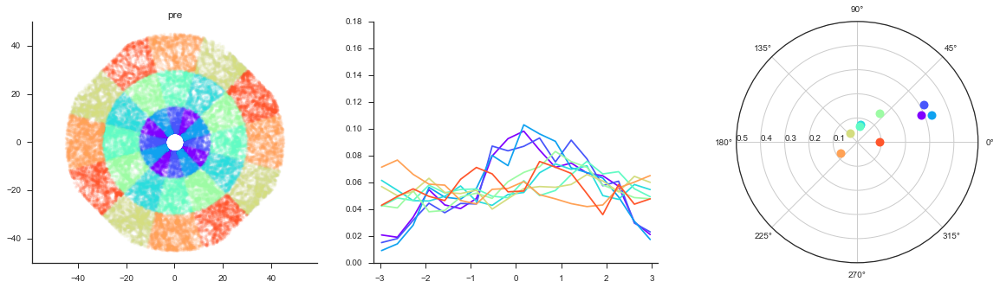

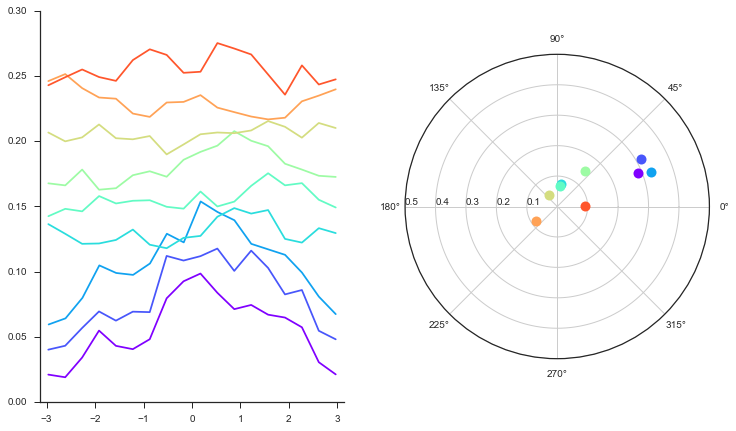

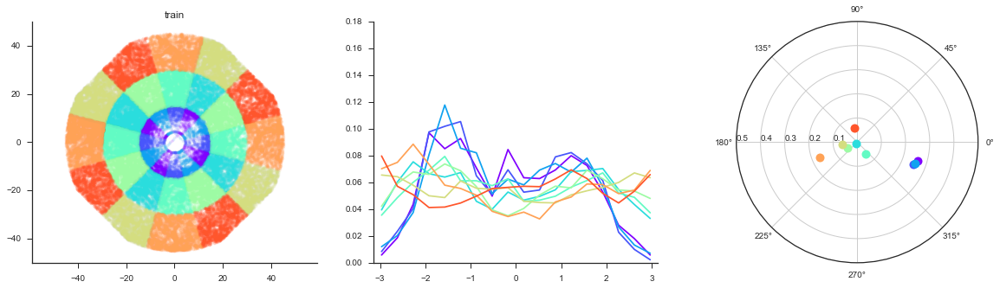

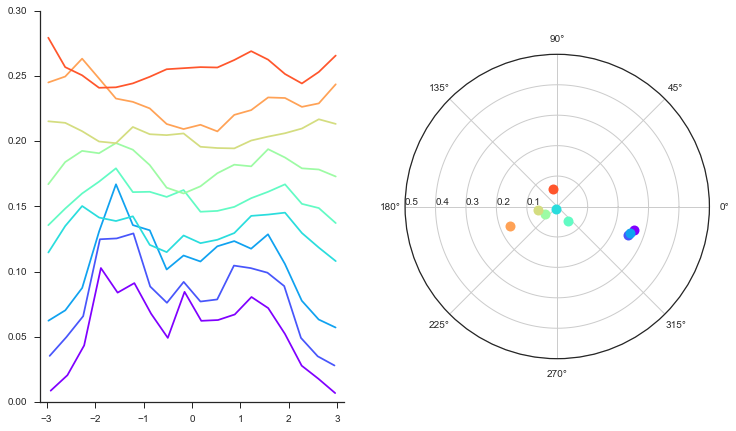

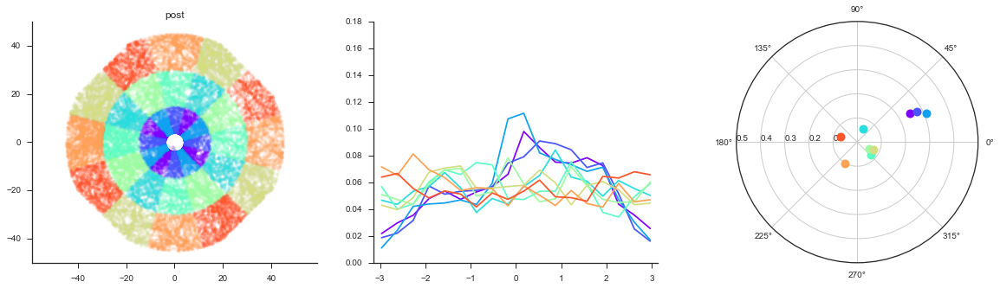

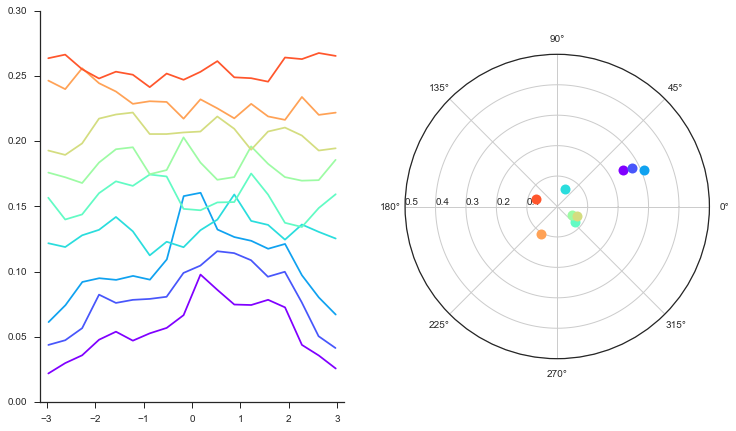

In [48]:
dist2LMTrials, xLMTrials, yLMTrials, angleLMTrials, gammaTrials, gammaFullTrials = computeLMcentricPosition(cyliCoords,'all')

minD = 0
maxD = 45
nedgesD = 4

minA = -45*(np.pi/180)
maxA = 45*(np.pi/180)
nedgesA = 4

gambins = 18

cNorm  = colors.Normalize(vmin=0, vmax=(nedgesD-1)*(nedgesA-1))
locCMap = plt.cm.ScalarMappable(norm=cNorm,cmap='rainbow')

try:
    mkdir(analysisDir + 'LMcentricAnalysis/')
except:
    print('Plot directory already exists')

for trial in range(len(trialName)):
    trialtype =trialName[trial]
    print(trialtype)
    
    LMheading = plt.figure(figsize=(20,5))
    LMheading = plotDistAngleBinedHeading(LMheading, trial, minD, maxD, nedgesD, minA, maxA, nedgesA, gambins, locCMap)
    
    LMheading.savefig(analysisDir + 'LMcentricAnalysis/'+ genotype +'_'+flyIDs[0][0]
                     +'_headingRel2Cylinder_'+trialtype+'_n'+ str(len(flyIDs)) +selectionTag+'.pdf', format='pdf')

    LMheading = plt.figure(figsize=(12,7))
    LMheading = plotDistAngleBinedHeading_v2(LMheading, trial, minD, maxD, nedgesD, minA, maxA, nedgesA, gambins, locCMap)

    LMheading.savefig(analysisDir + 'LMcentricAnalysis/'+ genotype +'_'+flyIDs[0][0]
                     +'_headingRel2Cylinder_v2_'+trialtype+'_n'+ str(len(flyIDs)) +selectionTag+'.pdf', format='pdf')

Plot directory already exists
pre
train
post


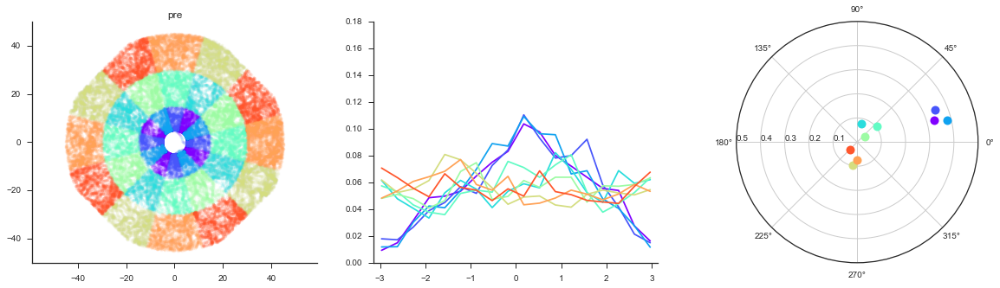

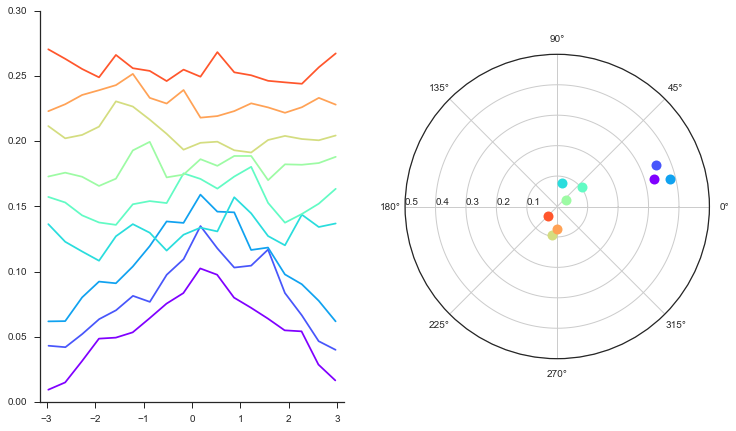

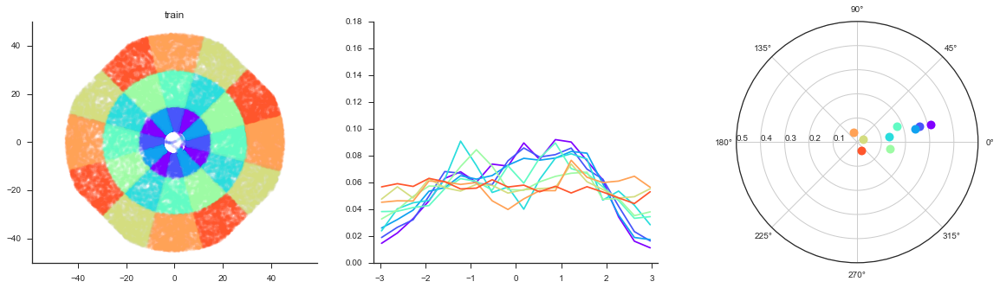

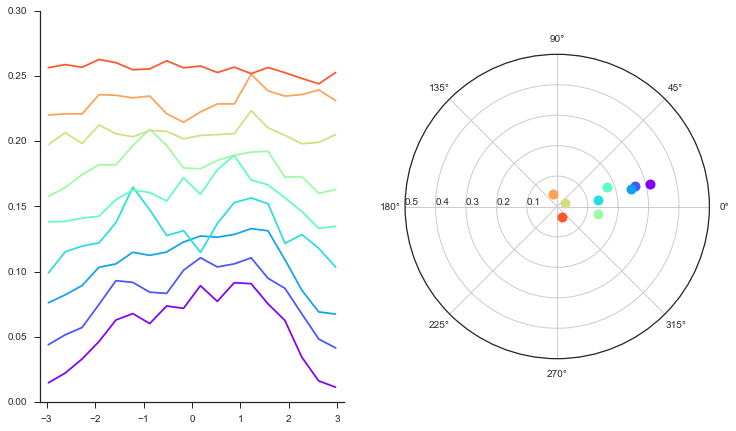

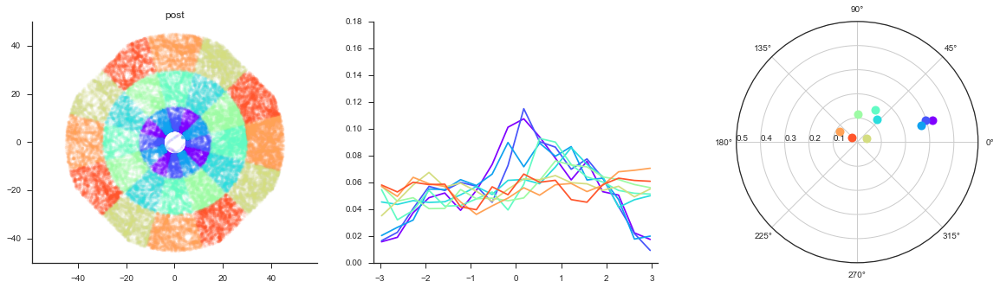

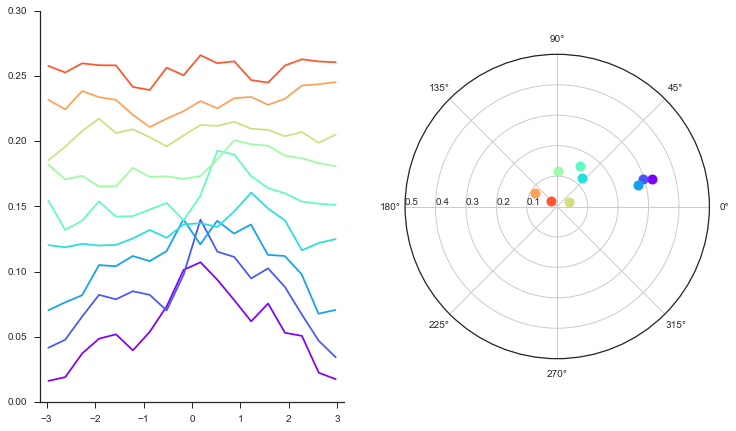

In [49]:
dist2LMTrials, xLMTrials, yLMTrials, angleLMTrials, gammaTrials, gammaFullTrials = computeLMcentricPosition(coneCoords,'all')

minD = 0
maxD = 45
nedgesD = 4

minA = -45*(np.pi/180)
maxA = 45*(np.pi/180)
nedgesA = 4

gambins = 18

cNorm  = colors.Normalize(vmin=0, vmax=(nedgesD-1)*(nedgesA-1))
locCMap = plt.cm.ScalarMappable(norm=cNorm,cmap='rainbow')

try:
    mkdir(analysisDir + 'LMcentricAnalysis/')
except:
    print('Plot directory already exists')

for trial in range(len(trialName)):
    trialtype =trialName[trial]
    print(trialtype)
    
    LMheading = plt.figure(figsize=(20,5))
    LMheading = plotDistAngleBinedHeading(LMheading, trial, minD, maxD, nedgesD, minA, maxA, nedgesA, gambins, locCMap)
    
    LMheading.savefig(analysisDir + 'LMcentricAnalysis/'+ genotype +'_'+flyIDs[0][0]
                     +'_headingRel2Cone_'+trialtype+'_n'+ str(len(flyIDs)) +selectionTag+'.pdf', format='pdf')

    LMheading = plt.figure(figsize=(12,7))
    LMheading = plotDistAngleBinedHeading_v2(LMheading, trial, minD, maxD, nedgesD, minA, maxA, nedgesA, gambins, locCMap)

    LMheading.savefig(analysisDir + 'LMcentricAnalysis/'+ genotype +'_'+flyIDs[0][0]
                     +'_headingRel2Cone_v2_'+trialtype+'_n'+ str(len(flyIDs)) +selectionTag+'.pdf', format='pdf')

In [50]:
def plotDistAngleBinedHeading_singleFly(fighand, trial, minD, maxD, nedgesD, minA, maxA, nedgesA, gambins, locCMap):
    
    dist2LM = dist2LMTrials[trial]
    angleLM = angleLMTrials[trial]
    xLM = xLMTrials[trial]
    yLM = yLMTrials[trial]
    gamma = gammaTrials[trial]
    gammaFull = gammaFullTrials[trial]

    dLMdist = np.hstack((0,np.diff(dist2LM)))

    # use symmetry along x and y axis -> collapse onto one circle quater
    ## collapse on quater
    origin = (0,0)
    axLM = xLM.copy()
    ayLM = yLM.copy()
    
    for pt in range(len(xLM)):
        point = (xLM[pt],yLM[pt])
        rotAngle = 0
        
        if( xLM[pt]<0 and yLM[pt]>0 ):
            rotAngle = (3*np.pi)/2
        if( xLM[pt]<0 and yLM[pt]<0 ):
            rotAngle = np.pi
        if( xLM[pt]>0 and yLM[pt]<0 ):
            rotAngle = np.pi/2
        
        x,y = rotate(origin, point, rotAngle)
        axLM[pt] = x
        ayLM[pt] = y
    
    ## rotate upper half down
    cxLM = axLM.copy()
    cyLM = ayLM.copy()
    cxLM[ayLM>axLM] = ayLM[ayLM>axLM]
    cyLM[ayLM>axLM] = -axLM[ayLM>axLM]

    # compute angular position (not heading!) relative to reference landmark  
    angleLM = np.arccos(cxLM/dist2LM)
    angleLM[cyLM<0] = -1*angleLM[cyLM<0]

    # bin data into distance bins
    binsD = np.linspace(minD, maxD,nedgesD)
    indsD = np.digitize(dist2LM,binsD)

    # bin data into angle bins
    binsA = np.linspace(minA, maxA,nedgesA)
    indsA = np.digitize(angleLM,binsA)

    # visualise rel. heading
    trialplt = fighand.add_subplot(1,4,1)
    trialplt.set_title(trialName[trial])
    #trialplt.set_xlim(-0, 60)
    #trialplt.set_ylim(-30,30)
    plt.axis('equal')
    myAxisTheme(trialplt)

    headplt = fighand.add_subplot(1,4,2)
    headplt2 = fighand.add_subplot(1,4,3)
    PVAplt = fighand.add_subplot(144,projection='polar')

    for binD in range(1,nedgesD):
        for binA in range(1,nedgesA):
            selectPts = np.logical_and(indsD==binD,indsA==binA)
            gammaselect = gammaFull[selectPts]
            
            offset = (binA-1)+((nedgesA-1)*(binD-1))

            locCol = locCMap.to_rgba(offset)

            try:
                n, ed = np.histogram(gammaselect[~np.isnan(gammaselect)],bins = np.linspace(-np.pi, np.pi,gambins+1))
                headplt.plot(ed[1:]-np.mean(np.diff(ed[:]))/2,n/(np.ones(len(n))*np.sum(n)),color=locCol)
                headplt2.plot(ed[1:]-np.mean(np.diff(ed[:]))/2,offset/40.0 + (n/(np.ones(len(n))*np.sum(n))),color=locCol)


            except ValueError:
                print('Not enough points')

            trialplt.plot(xLM[selectPts],yLM[selectPts],'.',color=locCol,alpha=0.1)

            meandir, meanlen = circmeanvec(gammaselect[~np.isnan(gammaselect)], \
                                           np.ones(len(gammaselect[~np.isnan(gammaselect)])),\
                                           high=np.pi, low=-np.pi)

            PVAplt.plot(meandir, meanlen,'.',markersize=20,color=locCol,alpha=1)
            PVAplt.set_rlim(0,1)
            PVAplt.set_rlabel_position(180)


    headplt.set_xlim(-np.pi, np.pi)
    headplt.set_ylim(0,0.3)
    myAxisTheme(headplt)
    
    headplt2.set_xlim(-np.pi, np.pi)
    myAxisTheme(headplt2)
    
    return fighand

In [51]:
def plotDistAngleBinedHeading_singleFly_v2(trialplt,headplt, trial, minD, maxD, nedgesD, minA, maxA, nedgesA, gambins, locCMap):
    
    dist2LM = dist2LMTrials[trial]
    angleLM = angleLMTrials[trial]
    xLM = xLMTrials[trial]
    yLM = yLMTrials[trial]
    gamma = gammaTrials[trial]
    gammaFull = gammaFullTrials[trial]

    dLMdist = np.hstack((0,np.diff(dist2LM)))

    # use symmetry along x and y axis -> collapse onto one circle quater
    ## collapse on quater
    origin = (0,0)
    axLM = xLM.copy()
    ayLM = yLM.copy()
    
    for pt in range(len(xLM)):
        point = (xLM[pt],yLM[pt])
        rotAngle = 0
        
        if( xLM[pt]<0 and yLM[pt]>0 ):
            rotAngle = (3*np.pi)/2
        if( xLM[pt]<0 and yLM[pt]<0 ):
            rotAngle = np.pi
        if( xLM[pt]>0 and yLM[pt]<0 ):
            rotAngle = np.pi/2
        
        x,y = rotate(origin, point, rotAngle)
        axLM[pt] = x
        ayLM[pt] = y
    
    ## rotate upper half down
    cxLM = axLM.copy()
    cyLM = ayLM.copy()
    cxLM[ayLM>axLM] = ayLM[ayLM>axLM]
    cyLM[ayLM>axLM] = -axLM[ayLM>axLM]

    # compute angular position (not heading!) relative to reference landmark  
    angleLM = np.arccos(cxLM/dist2LM)
    angleLM[cyLM<0] = -1*angleLM[cyLM<0]

    # bin data into distance bins
    binsD = np.linspace(minD, maxD,nedgesD)
    indsD = np.digitize(dist2LM,binsD)

    # bin data into angle bins
    binsA = np.linspace(minA, maxA,nedgesA)
    indsA = np.digitize(angleLM,binsA)

    # visualise rel. heading
    trialplt.set_title(trialName[trial])
    trialplt.set_xlim(-maxD, maxD)
    trialplt.set_ylim(-maxD, maxD)

    myAxisTheme(trialplt)

    for binD in range(1,nedgesD):
        for binA in range(1,nedgesA):
            selectPts = np.logical_and(indsD==binD,indsA==binA)
            gammaselect = gammaFull[selectPts]
            
            offset = (binA-1)+((nedgesA-1)*(binD-1))

            locCol = locCMap.to_rgba(offset)

            try:
                n, ed = np.histogram(gammaselect[~np.isnan(gammaselect)],bins = np.linspace(-np.pi, np.pi,gambins+1))
                headplt.plot(ed[1:]-np.mean(np.diff(ed[:]))/2,offset/30.0 + (n/(np.ones(len(n))*np.sum(n))),color=locCol)


            except ValueError:
                print('Not enough points')

            trialplt.plot(xLM[selectPts],yLM[selectPts],'.',color=locCol,alpha=0.1)
    
    headplt.set_xlim(-np.pi, np.pi)
    myAxisTheme(headplt)
    
    return trialplt,headplt

/Users/hannah/anaconda/lib/python2.7/site-packages/matplotlib/pyplot.py:516: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


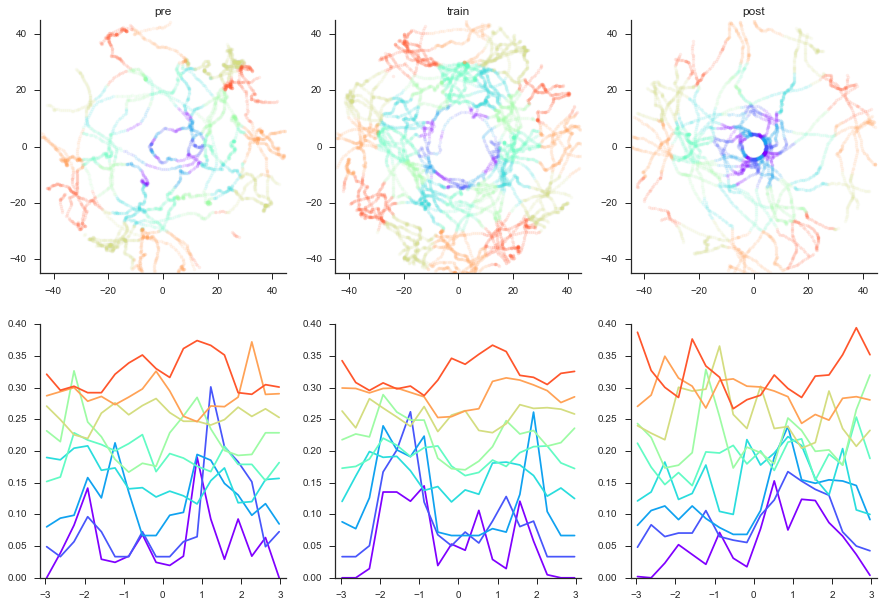

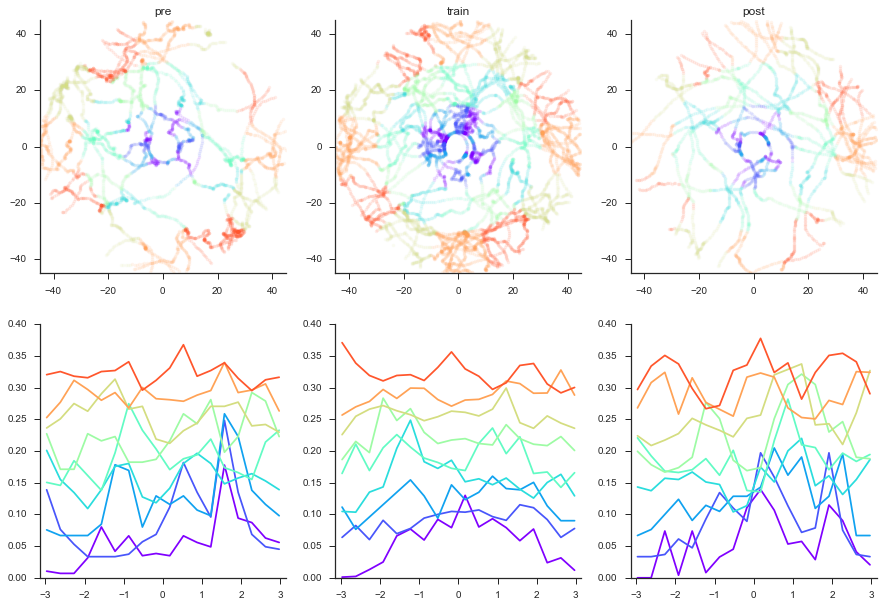

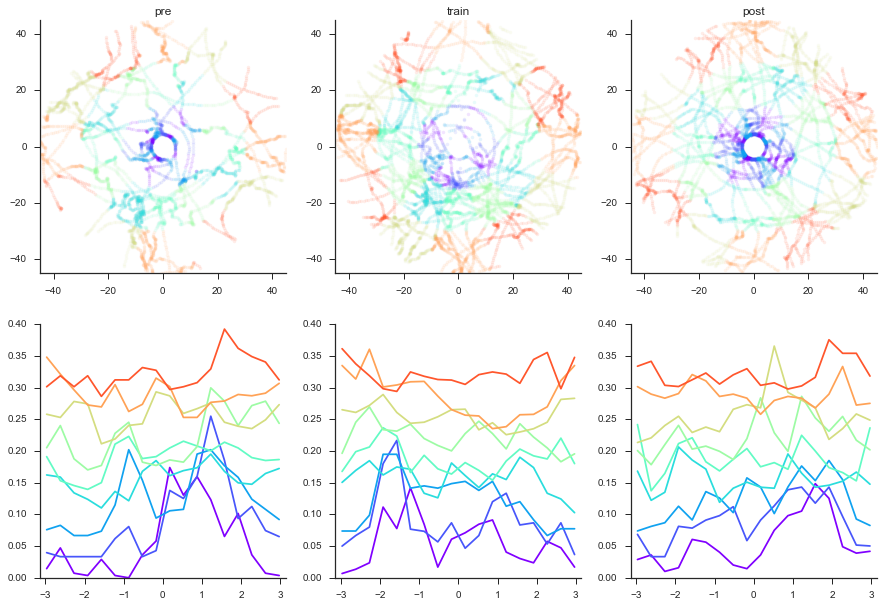

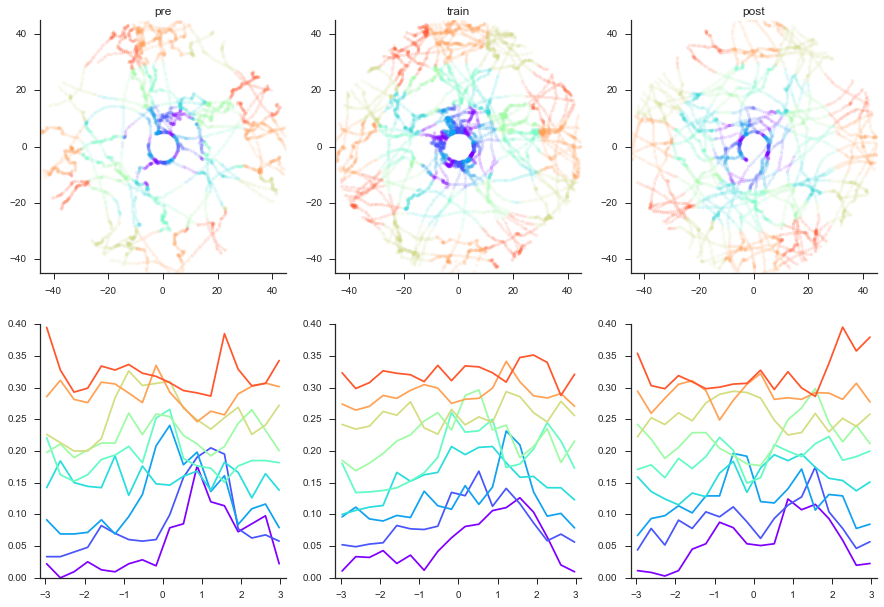

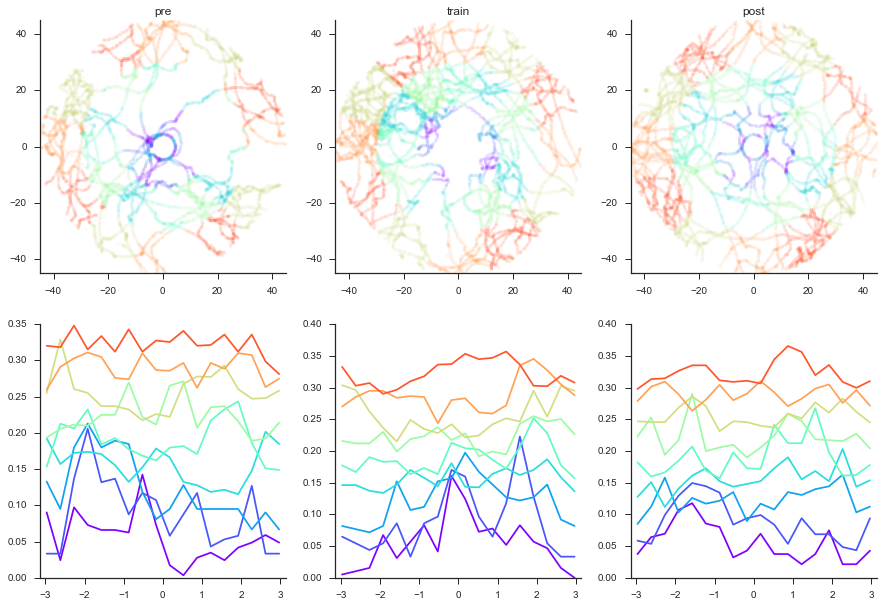

...

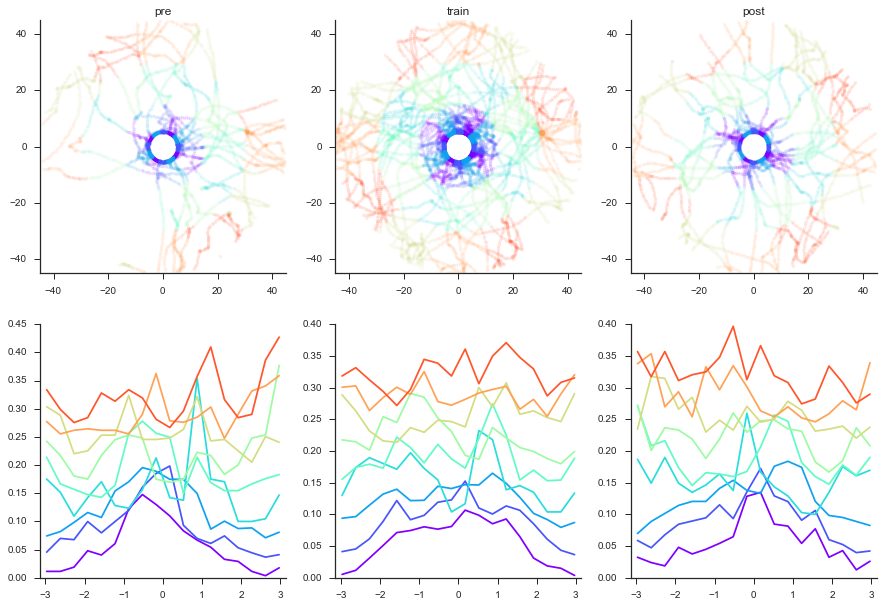

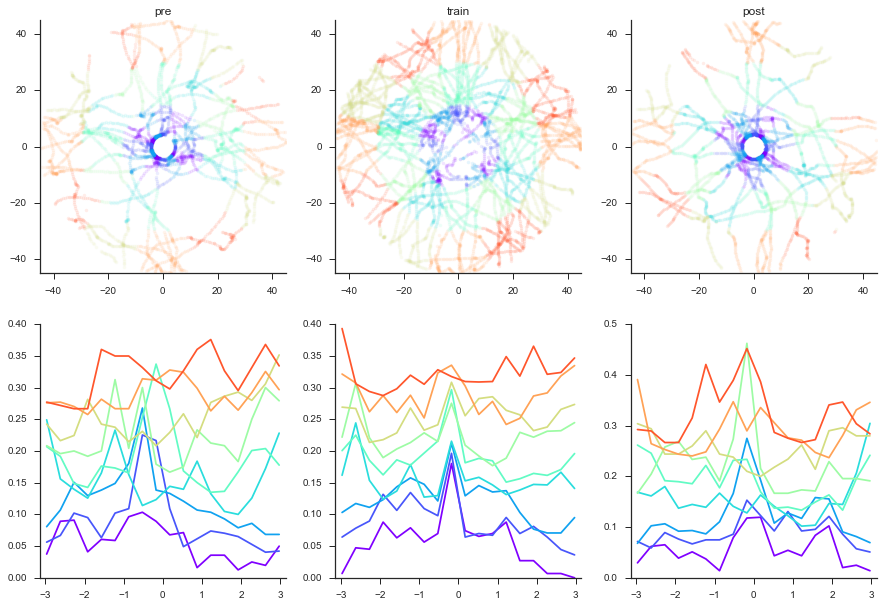

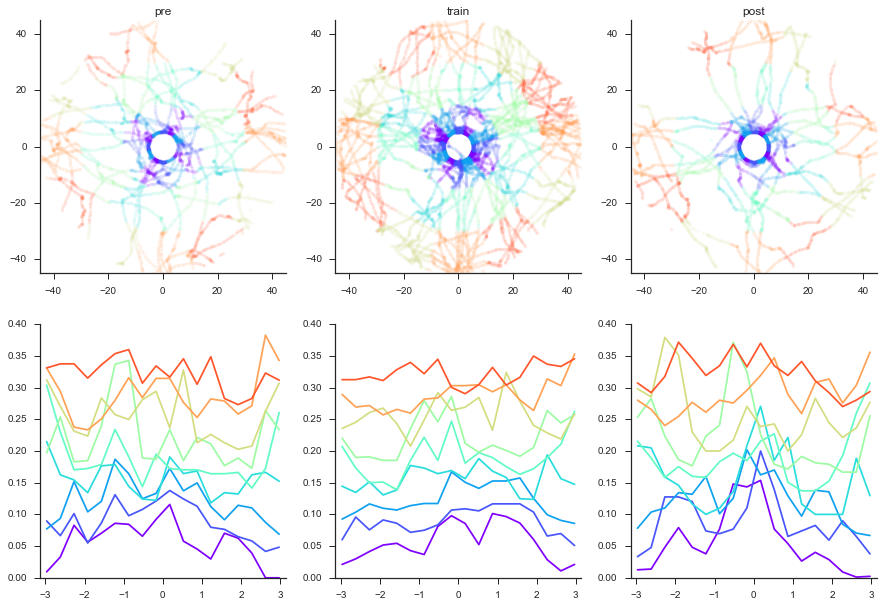

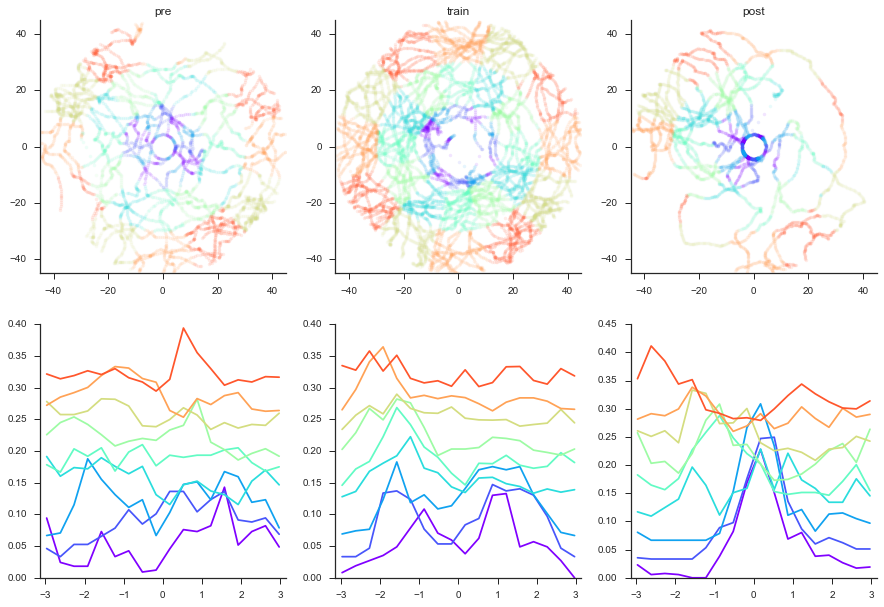

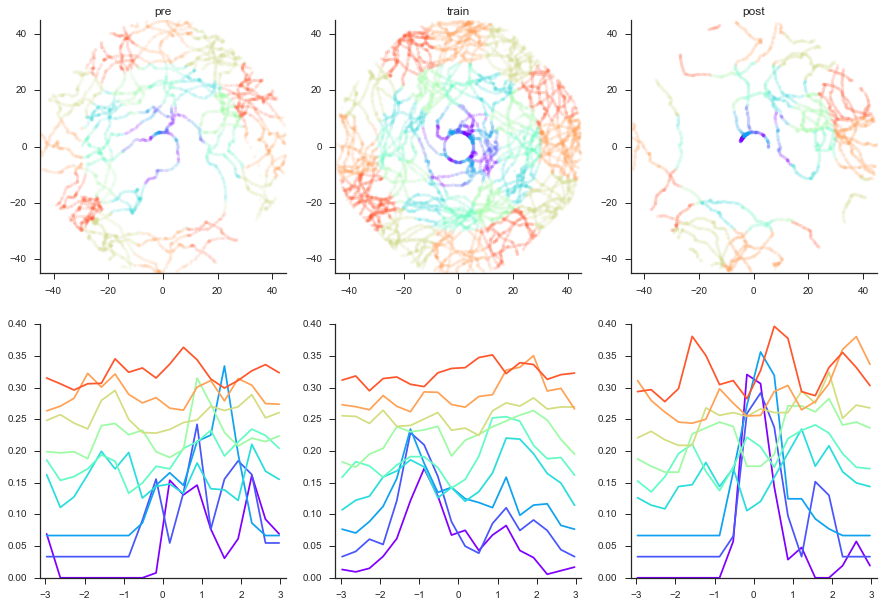

In [52]:
minD = 0
maxD = 45
nedgesD = 4

minA = -45*(np.pi/180)
maxA = 45*(np.pi/180)
nedgesA = 4

gambins = 18

cNorm  = colors.Normalize(vmin=0, vmax=(nedgesD-1)*(nedgesA-1))
locCMap = plt.cm.ScalarMappable(norm=cNorm,cmap='rainbow')

    
for fly in range(numFlies):
    flyName = flyIDs[fly]

    dist2LMTrials, xLMTrials, yLMTrials, angleLMTrials, gammaTrials, gammaFullTrials = computeLMcentricPosition(cyliCoords,flyName)

    LMheading = plt.figure(figsize=(15,10))

    for trial in range(len(trialName)):
        trialtype =trialName[trial]

        trialplt = LMheading.add_subplot(2,len(trialName),trial+1)
        headplt = LMheading.add_subplot(2,len(trialName),trial+4)

        trialplt,headplt = plotDistAngleBinedHeading_singleFly_v2(trialplt,headplt, trial, minD, maxD, nedgesD, minA, maxA, nedgesA, gambins, locCMap)

        LMheading.savefig(analysisDir + 'LMcentricAnalysis/'+ genotype +'_'+flyIDs[0][0]
                         +'_headingRel2Cylinder_'+ flyName +'.pdf', format='pdf')
        
    dist2LMTrials, xLMTrials, yLMTrials, angleLMTrials, gammaTrials, gammaFullTrials = computeLMcentricPosition(coneCoords,flyName)

    LMheading = plt.figure(figsize=(15,10))

    for trial in range(len(trialName)):
        trialtype =trialName[trial]

        trialplt = LMheading.add_subplot(2,len(trialName),trial+1)
        headplt = LMheading.add_subplot(2,len(trialName),trial+4)

        trialplt,headplt = plotDistAngleBinedHeading_singleFly_v2(trialplt,headplt, trial, minD, maxD, nedgesD, minA, maxA, nedgesA, gambins, locCMap)

        LMheading.savefig(analysisDir + 'LMcentricAnalysis/'+ genotype +'_'+flyIDs[0][0]
                         +'_headingRel2Cone_'+ flyName +'.pdf', format='pdf')

### Visualise pre-post change in the relative heading distribution

In [53]:
def plotDistAngleBinedHeading_v3(fighand, trial, minD, maxD, nedgesD, minA, maxA, nedgesA, gambins, locCMap):
    
    dist2LM = dist2LMTrials[trial]
    angleLM = angleLMTrials[trial]
    xLM = xLMTrials[trial]
    yLM = yLMTrials[trial]
    gamma = gammaTrials[trial]
    gammaFull = gammaFullTrials[trial]

    dLMdist = np.hstack((0,np.diff(dist2LM)))

    # use symmetry along x and y axis -> collapse onto one circle quater
    ## collapse on quater
    origin = (0,0)
    axLM = xLM.copy()
    ayLM = yLM.copy()
    
    for pt in range(len(xLM)):
        point = (xLM[pt],yLM[pt])
        
        rotAngle = 0
        
        if( xLM[pt]<0 and yLM[pt]>0 ):
            rotAngle = (3*np.pi)/2
        if( xLM[pt]<0 and yLM[pt]<0 ):
            rotAngle = np.pi
        if( xLM[pt]>0 and yLM[pt]<0 ):
            rotAngle = np.pi/2
        
        x,y = rotate(origin, point, rotAngle)
        axLM[pt] = x
        ayLM[pt] = y
    
    ## rotate upper half down
    cxLM = axLM.copy()
    cyLM = ayLM.copy()
    cxLM[ayLM>axLM] = ayLM[ayLM>axLM]
    cyLM[ayLM>axLM] = -axLM[ayLM>axLM]

    # compute angular position (not heading!) relative to reference landmark  
    angleLM = np.arccos(cxLM/dist2LM)
    angleLM[cyLM<0] = -1*angleLM[cyLM<0]

    # bin data into distance bins
    binsD = np.linspace(minD, maxD,nedgesD)
    indsD = np.digitize(dist2LM,binsD)

    # bin data into angle bins
    binsA = np.linspace(minA, maxA,nedgesA)
    indsA = np.digitize(angleLM,binsA)
    
    ns = np.nan * np.ones(((nedgesD-1)*(nedgesA-1), gambins))

    for binD in range(1,nedgesD):
        for binA in range(1,nedgesA):
            selectPts = np.logical_and(indsD==binD,indsA==binA)
            gammaselect = gammaFull[selectPts]
            
            offset = (binA-1)+((nedgesA-1)*(binD-1))
            locCol = locCMap.to_rgba(offset)
            
            headplt = fighand.add_subplot(1,(nedgesD-1)*(nedgesA-1),offset+1, projection='polar')

            try:
                n, ed = np.histogram(gammaselect[~np.isnan(gammaselect)],bins = np.linspace(-np.pi, np.pi,gambins+1))
                headplt.plot(ed[1:]-np.mean(np.diff(ed[:]))/2,n / (np.ones(len(n))*np.sum(n)),color=locCol)
                headplt.fill_between(ed[1:]-np.mean(np.diff(ed[:]))/2,0,n/(np.ones(len(n))*np.sum(n)),color=locCol,alpha=0.7)

            except ValueError:
                print('Not enough points')

            ns[offset] = n
            
            headplt.set_rticks([0.05])
            headplt.set_rlim([0,0.15])
            headplt.set_xticks([])
            
            arr1 = headplt.arrow(0, 0, 0, 0.06, alpha = 0.8, width = 0.01, head_width = 0.02,
                 edgecolor = 'black', facecolor = 'black', lw = 2, zorder = 5, length_includes_head =False)
            
    return fighand, ed, ns

pre
train
post


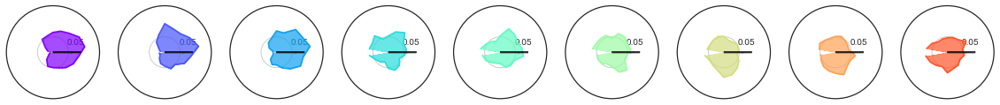

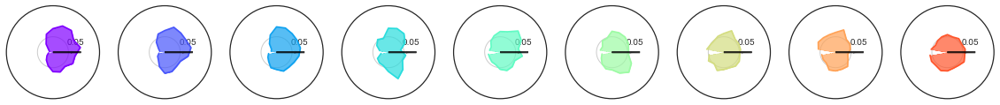

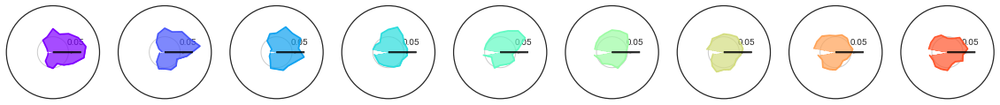

In [54]:
dist2LMTrials, xLMTrials, yLMTrials, angleLMTrials, gammaTrials, gammaFullTrials = computeLMcentricPosition(coneCoords,'all')

minD = 0
maxD = 45
nedgesD = 4

minA = -45*(np.pi/180)
maxA = 45*(np.pi/180)
nedgesA = 4

gambins = 18

cNorm  = colors.Normalize(vmin=0, vmax=(nedgesD-1)*(nedgesA-1))
locCMap = plt.cm.ScalarMappable(norm=cNorm,cmap='rainbow')

nsTrial_cone = np.zeros((len(trialName), (nedgesD-1)*(nedgesA-1), gambins))

for trial in range(len(trialName)):
    trialtype =trialName[trial]
    print(trialtype)

    LMheading = plt.figure(figsize=(20,7))

    LMheading,ed,ns = plotDistAngleBinedHeading_v3(LMheading, trial, minD, maxD, nedgesD, minA, maxA, nedgesA, gambins, locCMap)

    LMheading.savefig(analysisDir + 'LMcentricAnalysis/'+ genotype +'_'+flyIDs[0][0]
                     +'_headingRel2Cone_v3_'+trialtype+'_n'+ str(len(flyIDs)) +selectionTag+'.pdf', format='pdf')
    
    nsTrial_cone[trial, :, :] = ns

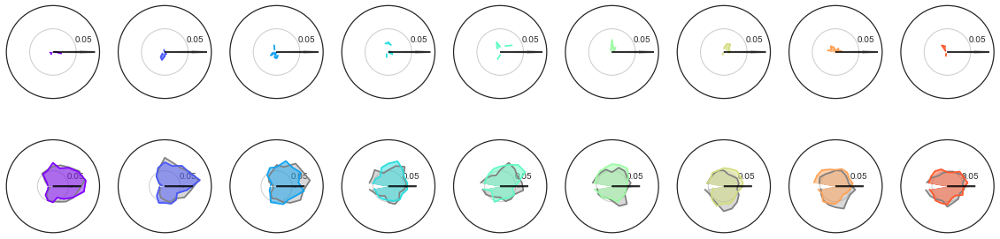

In [55]:
LMheading = plt.figure(figsize=(20,5))
nZones = (nedgesD-1)*(nedgesA-1)
for zone in range(nZones):
    
    normN1 = nsTrial_cone[0, zone, :] / (np.ones(gambins)*np.sum(nsTrial_cone[0, zone, :]))
    normN2 = nsTrial_cone[2, zone, :] / (np.ones(gambins)*np.sum(nsTrial_cone[2, zone, :]))
    
    locCol = locCMap.to_rgba(zone)

    normN = normN2 - normN1
    headplt = LMheading.add_subplot(2,nZones,zone+1, projection='polar')
    headplt.plot(ed[1:]-np.mean(np.diff(ed[:]))/2,normN,color=locCol)
    headplt.fill_between(ed[1:]-np.mean(np.diff(ed[:]))/2,0,normN,color=locCol,alpha=0.7)

    headplt.set_rticks([0.05])
    headplt.set_rlim([0,0.1])
    headplt.set_xticks([])
    
    arr1 = headplt.arrow(0, 0, 0, 0.06, alpha = 0.8, width = 0.01, head_width = 0.02,
         edgecolor = 'black', facecolor = 'black', lw = 2, zorder = 5, length_includes_head =False)
    
    headplt = LMheading.add_subplot(2,nZones,zone+1+nZones, projection='polar')
    headplt.plot(ed[1:]-np.mean(np.diff(ed[:]))/2,normN1,color='grey')
    headplt.fill_between(ed[1:]-np.mean(np.diff(ed[:]))/2,0,normN1,color='grey',alpha=0.3)
    headplt.plot(ed[1:]-np.mean(np.diff(ed[:]))/2,normN2,color=locCol)
    headplt.fill_between(ed[1:]-np.mean(np.diff(ed[:]))/2,0,normN2,color=locCol,alpha=0.5)

    headplt.set_rticks([0.05])
    headplt.set_rlim([0,0.15])
    headplt.set_xticks([])

    arr1 = headplt.arrow(0, 0, 0, 0.06, alpha = 0.8, width = 0.01, head_width = 0.02,
         edgecolor = 'black', facecolor = 'black', lw = 2, zorder = 5, length_includes_head =False)

pre
train
post


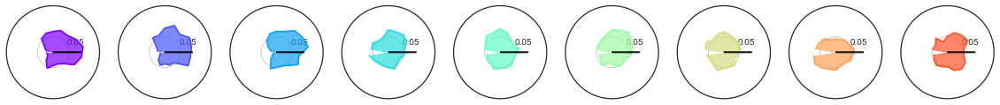

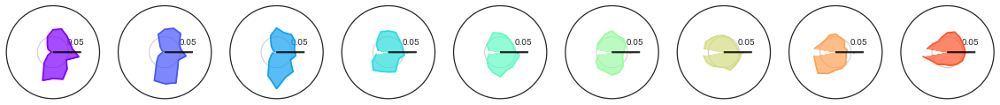

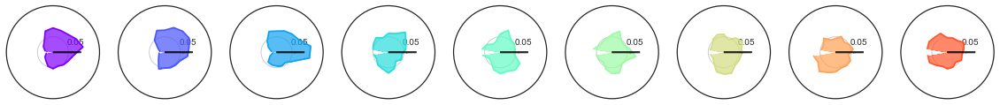

In [56]:
dist2LMTrials, xLMTrials, yLMTrials, angleLMTrials, gammaTrials, gammaFullTrials = computeLMcentricPosition(cyliCoords,'all')

minD = 0
maxD = 45
nedgesD = 4

minA = -45*(np.pi/180)
maxA = 45*(np.pi/180)
nedgesA = 4

gambins = 18

cNorm  = colors.Normalize(vmin=0, vmax=(nedgesD-1)*(nedgesA-1))
locCMap = plt.cm.ScalarMappable(norm=cNorm,cmap='rainbow')

nsTrial_cyli = np.zeros((len(trialName), (nedgesD-1)*(nedgesA-1), gambins))


for trial in range(len(trialName)):
    trialtype =trialName[trial]
    print(trialtype)

    LMheading = plt.figure(figsize=(20,7))

    LMheading,ed,ns = plotDistAngleBinedHeading_v3(LMheading, trial, minD, maxD, nedgesD, minA, maxA, nedgesA, gambins, locCMap)

    LMheading.savefig(analysisDir + 'LMcentricAnalysis/'+ genotype +'_'+flyIDs[0][0]
                     +'_headingRel2Cyli_v3_'+trialtype+'_n'+ str(len(flyIDs)) +selectionTag+'.pdf', format='pdf')
    
    nsTrial_cyli[trial, :, :] = ns

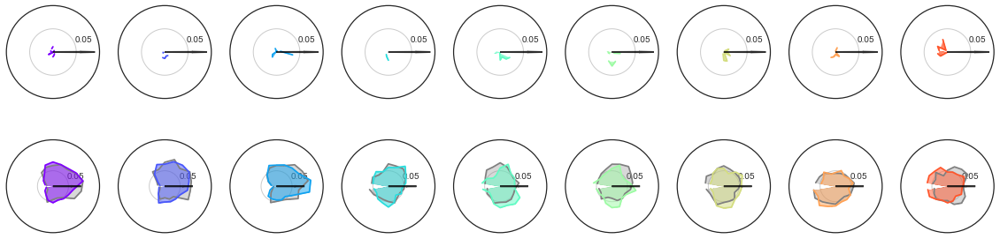

In [57]:
LMheading = plt.figure(figsize=(20,5))
nZones = (nedgesD-1)*(nedgesA-1)
for zone in range(nZones):
    
    normN1 = nsTrial_cyli[0, zone, :] / (np.ones(gambins)*np.sum(nsTrial_cyli[0, zone, :]))
    normN2 = nsTrial_cyli[2, zone, :] / (np.ones(gambins)*np.sum(nsTrial_cyli[2, zone, :]))
    
    locCol = locCMap.to_rgba(zone)

    normN = normN2 - normN1
    headplt = LMheading.add_subplot(2,nZones,zone+1, projection='polar')
    headplt.plot(ed[1:]-np.mean(np.diff(ed[:]))/2,normN,color=locCol)
    headplt.fill_between(ed[1:]-np.mean(np.diff(ed[:]))/2,0,normN,color=locCol,alpha=0.7)

    headplt.set_rticks([0.05])
    headplt.set_rlim([0,0.1])
    headplt.set_xticks([])
    
    arr1 = headplt.arrow(0, 0, 0, 0.06, alpha = 0.8, width = 0.01, head_width = 0.02,
         edgecolor = 'black', facecolor = 'black', lw = 2, zorder = 5, length_includes_head =False)
    
    headplt = LMheading.add_subplot(2,nZones,zone+1+nZones, projection='polar')
    headplt.plot(ed[1:]-np.mean(np.diff(ed[:]))/2,normN1,color='grey')
    headplt.fill_between(ed[1:]-np.mean(np.diff(ed[:]))/2,0,normN1,color='grey',alpha=0.3)
    headplt.plot(ed[1:]-np.mean(np.diff(ed[:]))/2,normN2,color=locCol)
    headplt.fill_between(ed[1:]-np.mean(np.diff(ed[:]))/2,0,normN2,color=locCol,alpha=0.5)

    headplt.set_rticks([0.05])
    headplt.set_rlim([0,0.15])
    headplt.set_xticks([])

    arr1 = headplt.arrow(0, 0, 0, 0.06, alpha = 0.8, width = 0.01, head_width = 0.02,
         edgecolor = 'black', facecolor = 'black', lw = 2, zorder = 5, length_includes_head =False)

## TODO: Add PVA for pre and post heading distribution

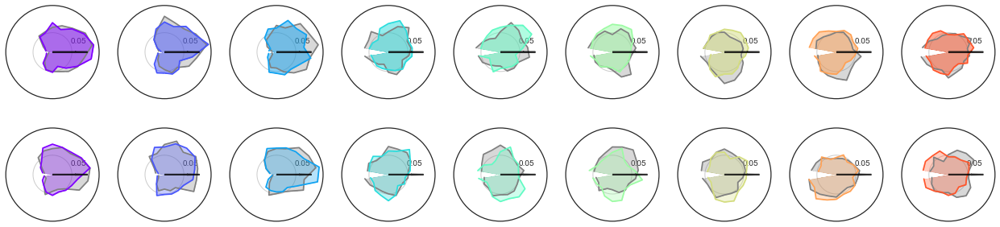

In [58]:
LMheading = plt.figure(figsize=(22,5))
nZones = (nedgesD-1)*(nedgesA-1)
for zone in range(nZones):
    
    locCol = locCMap.to_rgba(zone)
    
    normN1 = nsTrial_cone[0, zone, :] / (np.ones(gambins)*np.sum(nsTrial_cone[0, zone, :]))
    normN2 = nsTrial_cone[2, zone, :] / (np.ones(gambins)*np.sum(nsTrial_cone[2, zone, :]))

    headplt = LMheading.add_subplot(2,nZones,zone+1, projection='polar')
    headplt.plot(ed[1:]-np.mean(np.diff(ed[:]))/2,normN1,color='grey')
    headplt.fill_between(ed[1:]-np.mean(np.diff(ed[:]))/2,0,normN1,color='grey',alpha=0.3)
    headplt.plot(ed[1:]-np.mean(np.diff(ed[:]))/2,normN2,color=locCol)
    headplt.fill_between(ed[1:]-np.mean(np.diff(ed[:]))/2,0,normN2,color=locCol,alpha=0.5)

    headplt.set_rticks([0.05])
    headplt.set_rlim([0,0.12])
    headplt.set_xticks([])
    
    arr1 = headplt.arrow(0, 0, 0, 0.06, alpha = 0.8, width = 0.01, head_width = 0.02,
         edgecolor = 'black', facecolor = 'black', lw = 2, zorder = 5, length_includes_head =False)
    
    normN1 = nsTrial_cyli[0, zone, :] / (np.ones(gambins)*np.sum(nsTrial_cyli[0, zone, :]))
    normN2 = nsTrial_cyli[2, zone, :] / (np.ones(gambins)*np.sum(nsTrial_cyli[2, zone, :]))
    
    headplt = LMheading.add_subplot(2,nZones,zone+1+nZones, projection='polar')
    headplt.plot(ed[1:]-np.mean(np.diff(ed[:]))/2,normN1,color='grey')
    headplt.fill_between(ed[1:]-np.mean(np.diff(ed[:]))/2,0,normN1,color='grey',alpha=0.3)
    headplt.plot(ed[1:]-np.mean(np.diff(ed[:]))/2,normN2,color=locCol)
    headplt.fill_between(ed[1:]-np.mean(np.diff(ed[:]))/2,0,normN2,color=locCol,alpha=0.3)

    headplt.set_rticks([0.05])
    headplt.set_rlim([0,0.12])
    headplt.set_xticks([])

    arr1 = headplt.arrow(0, 0, 0, 0.06, alpha = 0.8, width = 0.01, head_width = 0.02,
         edgecolor = 'black', facecolor = 'black', lw = 2, zorder = 5, length_includes_head =False)
    

LMheading.savefig(analysisDir + 'LMcentricAnalysis/'+ genotype +'_'+flyIDs[0][0]
                  +'_headingRel2LM_prePost_'+trialtype+'_n'+ str(len(flyIDs)) +selectionTag+'.pdf', format='pdf')

In [147]:
def plotXYBinedHeading(fighand, trial, minD, maxD, nedgesD, minA, maxA, nedgesA, gambins, locCMap):
    
    xLM = xLMTrials[trial]
    yLM = yLMTrials[trial]
    gammaFull = gammaFullTrials[trial]

    # use symmetry along x and y axis -> collapse onto one circle quater
    ## collapse on quater
    origin = (0,0)
    axLM = xLM.copy()
    ayLM = yLM.copy()
    
    for pt in range(len(xLM)):
        point = (xLM[pt],yLM[pt])
        rotAngle = 0
        
        if( xLM[pt]<0 and yLM[pt]>0 ):
            rotAngle = (3*np.pi)/2
        if( xLM[pt]<0 and yLM[pt]<0 ):
            rotAngle = np.pi
        if( xLM[pt]>0 and yLM[pt]<0 ):
            rotAngle = np.pi/2
        
        x,y = rotate(origin, point, rotAngle)
        axLM[pt] = x
        ayLM[pt] = y
    
    ## rotate upper half down
    cxLM = axLM.copy()
    cyLM = ayLM.copy()
    cxLM[ayLM>axLM] = ayLM[ayLM>axLM]
    cyLM[ayLM>axLM] = -axLM[ayLM>axLM]
    
    # bin data into x-coord bins
    binsD = np.linspace(minD, maxD,nedgesD)
    indsD = np.digitize(cxLM,binsD)

    # bin data into y-coord bins
    binsA = np.linspace(minA, maxA,nedgesA)
    indsA = np.digitize(cyLM,binsA)

    # visualise rel. heading
    trialplt = fighand.add_subplot(1,3,1)
    trialplt.set_title(trialName[trial])
    #trialplt.set_xlim(-0, 60)
    #trialplt.set_ylim(-30,30)
    myAxisTheme(trialplt)

    headplt = fighand.add_subplot(1,3,2)
    PVAplt = fighand.add_subplot(133,projection='polar')

    for binD in range(1,nedgesD):
        for binA in range(1,nedgesA):
            selectPts = np.logical_and(indsD==binD,indsA==binA)
            gammaselect = gammaFull[selectPts]

            locCol = locCMap.to_rgba((binA-1)+((nedgesA-1)*(binD-1)))

            try:
                n, ed = np.histogram(gammaselect[~np.isnan(gammaselect)],bins = gambins)
                headplt.plot(ed[1:]-np.mean(np.diff(ed[:]))/2,n/(np.ones(len(n))*np.sum(n)),color=locCol)

            except ValueError:
                print('Not enough points')

            trialplt.plot(cxLM[selectPts],cyLM[selectPts],'.',color=locCol,alpha=0.1)

            meandir, meanlen = circmeanvec(gammaselect[~np.isnan(gammaselect)], \
                                           np.ones(len(gammaselect[~np.isnan(gammaselect)])),\
                                           high=np.pi, low=-np.pi)

            PVAplt.plot(meandir, meanlen,'.',markersize=20,color=locCol,alpha=1)
            PVAplt.set_rlim(0,0.5)
            PVAplt.set_rlabel_position(180)


    #headplt.set_xlim(-np.pi, np.pi)
    headplt.set_ylim(0,0.18)
    myAxisTheme(headplt)
    
    return fighand, binsD, indsD

In [148]:
dist2LMTrials, xLMTrials, yLMTrials, angleLMTrials, gammaTrials, gammaFullTrials = computeLMcentricPosition(coneCoords)

# x
minD = 0
maxD = 60
nedgesD = 6

# y
minA = -30
maxA = 30
nedgesA = 6

gambins = 18

cNorm  = colors.Normalize(vmin=0, vmax=(nedgesD-1)*(nedgesA-1))
locCMap = plt.cm.ScalarMappable(norm=cNorm,cmap='rainbow')

for trial in range(len(trialName)):
    trialtype =trialName[trial]

    LMheading = plt.figure(figsize=(20,5))

    LMheading, binsD, indsD = plotXYBinedHeading(LMheading, trial, minD, maxD, nedgesD, minA, maxA, nedgesA, gambins, locCMap)

    LMheading.savefig(analysisDir + 'LMcentricAnalysis/'+ genotype +'_'+flyIDs[0][0]
                     +'_YX-headingRel2Cone_'+trialtype+'_n'+ str(len(flyIDs)) +'.pdf', format='pdf')

TypeError: computeLMcentricPosition() takes exactly 2 arguments (1 given)